In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "SharkDAO"
SPLITS_FREQ = "3d"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2022-04-27"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'SharkDAO/LightGCN_3d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,83,5,0.000547,2.012112e-04,0.000346,0.1,0.1,0.1,0.1,1.0,...,147.96.81.131,0.324267,1,9,26,2,0.6694,0.000001,30d,2022-03-31T00:00:00
1,83,10,0.008688,8.116476e-03,0.000572,0.3,0.3,0.3,0.3,1.0,...,147.96.81.131,0.470761,2,9,26,2,0.6694,0.000001,30d,2022-03-31T00:00:00
2,83,15,0.000804,2.944474e-14,0.000804,0.4,0.4,0.4,0.4,1.0,...,147.96.81.131,0.616809,3,9,26,2,0.6694,0.000001,30d,2022-03-31T00:00:00
3,83,20,0.000958,2.250147e-23,0.000958,0.4,0.4,0.4,0.4,1.0,...,147.96.81.131,0.764128,4,9,26,2,0.6694,0.000001,30d,2022-03-31T00:00:00
4,83,25,0.001545,4.205333e-04,0.001125,0.2,0.2,0.2,0.2,1.0,...,147.96.81.131,0.910539,5,9,26,2,0.6694,0.000001,30d,2022-03-31T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,64,180,0.008603,2.234531e-03,0.006368,0.0,0.0,0.0,0.0,1.0,...,147.96.81.131,5.810736,36,6,38,4,0.0072,0.000124,60d,2022-03-31T00:00:00
36,64,185,0.008734,2.397115e-03,0.006337,0.0,0.0,0.0,0.0,1.0,...,147.96.81.131,5.966295,37,6,38,4,0.0072,0.000124,60d,2022-03-31T00:00:00
37,64,190,0.008130,1.781699e-03,0.006349,0.0,0.0,0.0,0.0,1.0,...,147.96.81.131,6.120507,38,6,38,4,0.0072,0.000124,60d,2022-03-31T00:00:00
38,64,195,0.008183,1.855664e-03,0.006327,0.0,0.0,0.0,0.0,1.0,...,147.96.81.131,6.280249,39,6,38,4,0.0072,0.000124,60d,2022-03-31T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
7,62,40,0.000860,0.000847,0.000013,1.0,0.333333,0.2,0.1,0.066667,...,0.990080,False,8ebb4873,1024,581,3,0.0058,5.074268e-07,21d,2022-03-31
8,62,45,0.000474,0.000460,0.000013,1.0,0.333333,0.2,0.1,0.066667,...,1.114755,False,8ebb4873,1024,581,3,0.0058,5.074268e-07,21d,2022-03-31
9,62,50,0.000365,0.000352,0.000013,1.0,0.333333,0.2,0.1,0.066667,...,1.237716,False,8ebb4873,1024,581,3,0.0058,5.074268e-07,21d,2022-03-31
11,62,60,0.000375,0.000361,0.000014,1.0,0.333333,0.2,0.1,0.066667,...,1.484882,False,8ebb4873,1024,581,3,0.0058,5.074268e-07,21d,2022-03-31
0,83,5,0.000547,0.000201,0.000346,1.0,0.333333,0.2,0.1,0.066667,...,0.123594,False,ae7c352c,512,26,2,0.6694,1.427212e-06,30d,2022-03-31


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2022-03-31    100
2022-04-03    100
2022-04-06    100
2022-04-09    100
2022-04-12    100
2022-04-15    100
2022-04-18    100
2022-04-21    100
2022-04-24    100
2022-04-27    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
0068f186  256                57                    2                   0.0594                3.010285e-03  90d                 2022-03-31     1.335362
0138eaa5  256                1                     1                   0.0572                1.081105e-03  30d                 2022-04-12     0.795219
01402df9  256                1                     3                   0.0038                9.123925e-04  21d                 2022-04-03     0.605225
0157ea19  512                1                     1                   0.1528                4.300993e-05  60d                 2022-04-24     1.619286
01d57b4d  64                 882                   1                   0.3759                1.086514e-07  90d                 2022-04-27     3.216818
                                                                                                          

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.0
mean      200.0
std         0.0
min       200.0
25%       200.0
50%       200.0
75%       200.0
max       200.0
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.280397
precision@3        0.276647
precision@5        0.271091
precision@10       0.155462
precision@15       0.103642
precision@100      0.015546
ndcg@1             0.270063
ndcg@3             0.368180
ndcg@5             0.477698
ndcg@10            0.509381
ndcg@15            0.509381
ndcg@100           0.509381
map@1              0.280397
map@3              0.320422
map@5              0.387955
map@10             0.409897
map@15             0.409897
map@100            0.409897
recall@1           0.159646
recall@3           0.409896
recall@5           0.681104
recall@10          0.764451
recall@15          0.764451
recall@100         0.764451
r-precision@1      0.402127
r-precision@3      0.509333
r-precision@5      0.639527
r-precision@10     0.649403
r-precision@15     0.649403
r-precision@100    0.649403
time_eval          0.123934
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-21,0.600000,0.333333,0.200000,0.100000,0.066667,0.010000,0.500000,0.479751,0.458305,0.458305,...,0.600000,0.600000,0.600000,0.583333,0.666667,0.666667,0.666667,0.666667,0.666667,0.126366
2023-06-24,0.142857,0.476190,0.342857,0.171429,0.114286,0.017143,0.142857,0.575817,0.608663,0.608663,...,1.000000,1.000000,1.000000,0.333333,0.750000,0.875000,0.875000,0.875000,0.875000,0.123368
2023-06-27,0.000000,0.000000,0.200000,0.100000,0.066667,0.010000,0.000000,0.000000,0.430677,0.430677,...,1.000000,1.000000,1.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.108643
2023-06-30,0.000000,0.138889,0.083333,0.041667,0.027778,0.004167,0.000000,0.116848,0.116848,0.116848,...,0.180556,0.180556,0.180556,0.000000,0.433333,0.433333,0.433333,0.433333,0.433333,0.120138
2023-07-03,0.250000,0.479167,0.462500,0.268750,0.179167,0.026875,0.250000,0.525917,0.595538,0.628223,...,0.773958,0.773958,0.773958,0.458333,0.498889,0.617778,0.651111,0.651111,0.651111,0.127482
2023-07-06,0.200000,0.200000,0.200000,0.120000,0.080000,0.012000,0.200000,0.231985,0.309426,0.336021,...,0.440000,0.440000,0.440000,0.555556,0.389583,0.424074,0.424074,0.424074,0.424074,0.127107
2023-07-09,0.083333,0.111111,0.216667,0.108333,0.072222,0.010833,0.080000,0.157792,0.438739,0.434993,...,0.875000,0.875000,0.875000,0.583333,0.583333,0.625000,0.625000,0.625000,0.625000,0.129676
2023-07-12,0.777778,0.333333,0.255556,0.127778,0.085185,0.012778,0.777778,0.782357,0.866194,0.866194,...,1.000000,1.000000,1.000000,0.869048,0.916667,0.916667,0.916667,0.916667,0.916667,0.125586
2023-07-15,0.416667,0.361111,0.383333,0.250000,0.166667,0.025000,0.416667,0.433776,0.504734,0.596260,...,0.775000,0.775000,0.775000,0.430000,0.493750,0.641667,0.641667,0.641667,0.641667,0.126526


(0.0, 1.0)

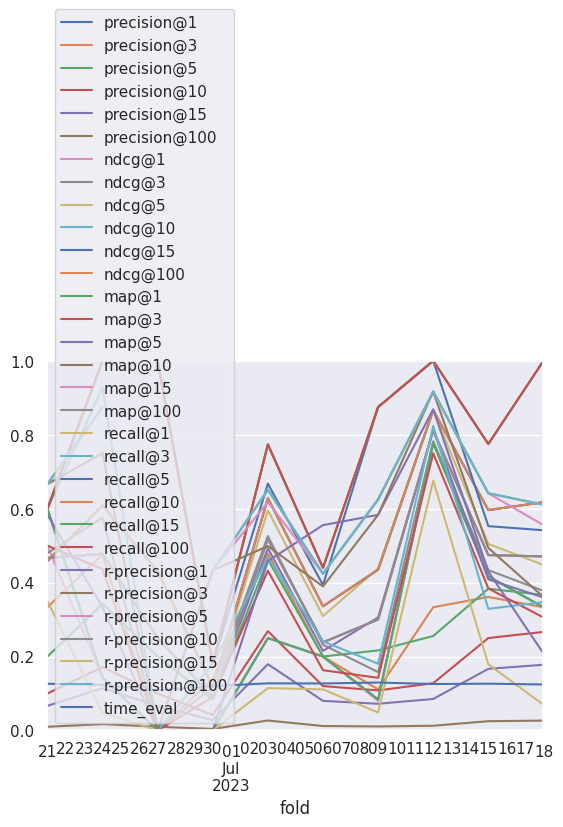

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        1.000000
precision@3        0.572140
precision@5        0.393491
precision@10       0.202146
precision@15       0.134764
precision@100      0.020215
ndcg@1             1.000000
ndcg@3             1.000000
ndcg@5             1.000000
ndcg@10            1.000000
ndcg@15            1.000000
ndcg@100           1.000000
map@1              1.000000
map@3              1.000000
map@5              1.000000
map@10             1.000000
map@15             1.000000
map@100            1.000000
recall@1           0.718306
recall@3           0.940199
recall@5           0.991000
recall@10          1.000000
recall@15          1.000000
recall@100         1.000000
r-precision@1      0.718306
r-precision@3      0.940199
r-precision@5      0.991000
r-precision@10     1.000000
r-precision@15     1.000000
r-precision@100    1.000000
time_eval          0.128909
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-21,1.0,0.500000,0.333333,0.166667,0.111111,0.016667,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.791667,0.958333,1.000000,1.0,1.0,1.0,0.127610
2023-06-24,1.0,0.523810,0.342857,0.171429,0.114286,0.017143,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.797619,0.964286,1.000000,1.0,1.0,1.0,0.128522
2023-06-27,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.000000,1.000000,1.0,1.0,1.0,0.126080
2023-06-30,1.0,0.533333,0.320000,0.160000,0.106667,0.016000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.744444,1.000000,1.000000,1.0,1.0,1.0,0.128714
2023-07-03,1.0,0.791667,0.612500,0.331250,0.220833,0.033125,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.423958,0.834375,0.958333,1.0,1.0,1.0,0.131385
2023-07-06,1.0,0.755556,0.506667,0.253333,0.168889,0.025333,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.524444,0.940000,1.000000,1.0,1.0,1.0,0.129600
2023-07-09,1.0,0.413333,0.264000,0.136000,0.090667,0.013600,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.900000,0.980000,0.993333,1.0,1.0,1.0,0.129972
2023-07-12,1.0,0.425926,0.255556,0.127778,0.085185,0.012778,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.898148,1.000000,1.000000,1.0,1.0,1.0,0.128794
2023-07-15,1.0,0.777778,0.600000,0.308333,0.205556,0.030833,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.477778,0.850000,0.986111,1.0,1.0,1.0,0.129707


(0.0, 1.0)

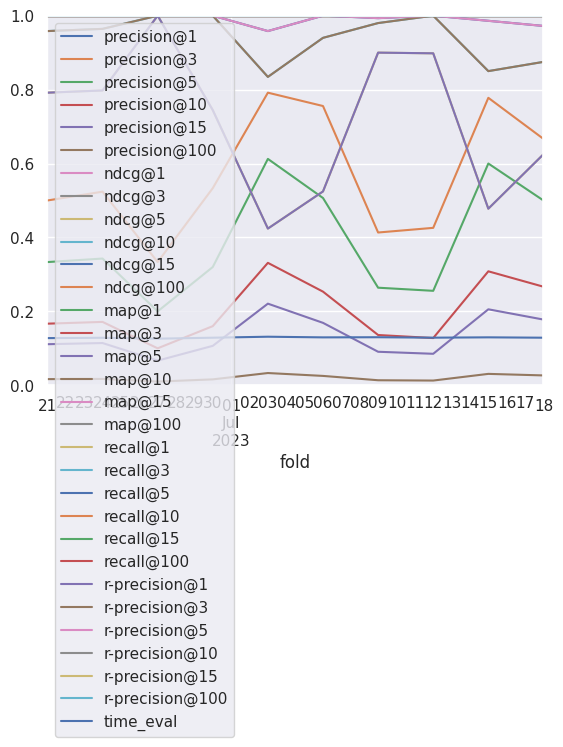

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,83,5,0.000547,2.012112e-04,0.000346,0.100000,0.100000,0.100000,0.100000,1.000000,...,0.324267,1,9,26,2,0.6694,1.427212e-06,30d,2022-03-31T00:00:00,ae7c352c
1,512,5,0.641727,6.310452e-01,0.010682,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.450292,1,9,139,1,0.0010,5.728134e-03,10YE,2022-03-31T00:00:00,322c1a88
2,151,5,0.020585,1.729224e-02,0.003293,0.100000,0.100000,0.100000,0.100000,1.000000,...,0.340331,1,8,26,1,0.1550,5.007340e-05,90d,2022-03-31T00:00:00,defc73d0
3,104,5,0.670029,6.700250e-01,0.000004,0.400000,0.400000,0.400000,0.400000,1.000000,...,0.334082,1,10,4,3,0.0094,5.037199e-06,60d,2022-03-31T00:00:00,388f5573
4,62,5,0.002909,1.514532e-11,0.002909,0.500000,0.500000,0.500000,0.500000,1.000000,...,0.342693,1,6,217,2,0.4785,2.539909e-06,21d,2022-03-31T00:00:00,77698aec
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,111,35,0.636749,6.363376e-01,0.000412,0.000000,0.000000,0.000000,0.000000,0.583333,...,1.364682,7,9,86,3,0.0002,1.667490e-04,30d,2022-04-27T00:00:00,6fb1309b
96,64,100,0.005410,3.211647e-03,0.002199,0.000000,0.000000,0.000000,0.000000,0.583333,...,3.843682,20,6,90,3,0.2256,5.610161e-07,21d,2022-04-27T00:00:00,8f0728af
97,94,5,0.063600,6.359349e-02,0.000007,0.027778,0.083333,0.083333,0.083333,0.500000,...,0.341374,1,7,50,1,0.0286,4.168789e-07,21d,2022-04-27T00:00:00,184a375a
98,64,160,0.150815,1.170715e-13,0.150815,0.000000,0.000000,0.000000,0.000000,0.583333,...,6.907230,32,6,58,4,0.5382,6.289603e-06,60d,2022-04-27T00:00:00,312145f3


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-03-31 512        26            2           0.6694        1.427212e-06 30d                  5   
                                                                           30d                 10   
                                                                           30d                 15   
                                                                           30d                 20   
                                                                           30d                 25   
...                                                                                           ...   
2022-04-27 64         910           1           0.9155        2.418411e-07 21d                180   
                                                                           21d                185   
                                                                           21d                190   
                                                                           21d                195   
                                                                           21d                200   

                                                                                             loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-03-31 512        26            2           0.6694        1.427212e-06 30d           0.000547   
                                                                           30d           0.008688   
                                                                           30d           0.000804   
                                                                           30d           0.000958   
                                                                           30d           0.001545   
...                                                                                           ...   
2022-04-27 64         910           1           0.9155        2.418411e-07 21d           0.269962   
                                                                           21d           0.272479   
                                                                           21d           0.277203   
                                                                           21d          68.208310   
                                                                           21d           0.283169   

                                                                                             mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size                 
2022-03-31 512        26            2           0.6694        1.427212e-06 30d          2.012112e-04   
                                                                           30d          8.116476e-03   
                                                                           30d          2.944474e-14   
                                                                           30d          2.250147e-23   
                                                                           30d          4.205333e-04   
...                                                                                              ...   
2022-04-27 64         910           1           0.9155        2.418411e-07 21d          0.000000e+00   
                                                                           21d          0.000000e+00   
                                                                           21d          0.000000e+00   
                                                                           21d          6.792883e+01   
                                                                           21d          0.000000e+00   

                                                                                        emb_loss  \
fold   

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/SharkDAO/models/lightgcn-all_3d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-04-24 256        6             3           0.0001        5.155397e-06 90d                190   
                      1             2           0.0002        6.516981e-07 60d                140   
           512        1             1           0.2888        3.660760e-03 10YE               110   
           1024       20            2           0.1101        3.118214e-06 90d                 25   
                      3             1           0.0006        3.578454e-07 10YE                40   
...                                                                                           ...   
2022-03-31 512        10            4           0.0137        5.854564e-03 90d                195   
                      86            2           0.0006        1.343254e-03 21d                185   
           128        14            1           0.0026        5.174864e-04 10YE               200   
           1024       581           3           0.0058        5.074268e-07 21d                 60   
           512        26            2           0.6694        1.427212e-06 30d                  5   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-04-24 256        6             3           0.0001        5.155397e-06 90d          0.678084   
                      1             2           0.0002        6.516981e-07 60d          0.685726   
           512        1             1           0.2888        3.660760e-03 10YE         0.431730   
           1024       20            2           0.1101        3.118214e-06 90d          0.003949   
                      3             1           0.0006        3.578454e-07 10YE         0.654614   
...                                                                                          ...   
2022-03-31 512        10            4           0.0137        5.854564e-03 90d          0.134390   
                      86            2           0.0006        1.343254e-03 21d          0.070313   
           128        14            1           0.0026        5.174864e-04 10YE         0.037047   
           1024       581           3           0.0058        5.074268e-07 21d          0.000375   
           512        26            2           0.6694        1.427212e-06 30d          0.000547   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-04-24 256        6             3           0.0001        5.155397e-06 90d          0.678081   
                      1             2           0.0002        6.516981e-07 60d          0.685726   
           512        1             1           0.2888        3.660760e-03 10YE         0.418385   
           1024       20            2           0.1101        3.118214e-06 90d          0.003651   
                      3             1           0.0006        3.578454e-07 10YE         0.654614   
...                                                                                          ...   
2022-03-31 512        10            4           0.0137        5.854564e-03 90d          0.045760   
                      86            2           0.0006        1.343254e-03 21d          0.057859   
           128        14            1           0.0026        5.174864e-04 10YE         0.023361   
           1024       581           3           0.0058        5.074268e-07 21d          0.000361   
           512        26            2           0.6694        1.427212e-06 30d          0.000201   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2    

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/SharkDAO/models/lightgcn-best-val_3d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2022-03-31,512,26,2,0.6694,1.427212e-06,30d,5,0.000547,0.000201,3.462494e-04,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.020271,0.168534,0.123594,False,ae7c352c
2022-04-03,256,1,3,0.1371,4.706833e-07,30d,155,0.339839,0.339828,1.073802e-05,0.766667,0.422222,0.253333,0.126667,0.084444,0.012667,0.766667,...,0.979167,0.979167,0.979167,0.979167,0.979167,0.001220,0.658605,3.901887,False,bf2dfd49
2022-04-06,512,570,3,0.9558,1.452011e-03,90d,55,12.154623,1.918896,1.023573e+01,1.000000,0.407407,0.244444,0.122222,0.081481,0.012222,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001706,0.563054,1.491191,False,26314135
2022-04-09,512,2,3,0.0004,5.055870e-03,21d,95,0.674791,0.673004,1.786775e-03,0.800000,0.546667,0.328000,0.164000,0.109333,0.016400,0.800000,...,0.869565,0.869565,0.869565,0.869565,0.869565,0.001193,0.492847,2.445634,False,563b387f
2022-04-12,512,63,1,0.2724,1.672184e-06,90d,80,0.060833,0.057516,3.316521e-03,0.684211,0.421053,0.368421,0.184211,0.122807,0.018421,0.684211,...,0.755556,0.755556,0.755556,0.755556,0.755556,0.001366,0.524334,2.096498,False,1ae37119
2022-04-15,64,1,1,0.0024,2.313349e-06,21d,115,0.438294,0.438290,4.622010e-06,0.769231,0.551282,0.446154,0.223077,0.148718,0.022308,0.769231,...,0.853968,0.896825,0.896825,0.896825,0.896825,0.001140,0.618493,3.032310,False,81da573b
2022-04-18,128,3,3,0.9796,2.018032e-04,60d,65,0.314668,0.305588,9.079291e-03,1.000000,0.555556,0.333333,0.166667,0.111111,0.016667,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002282,0.511815,1.678203,False,d73633c6
2022-04-21,128,277,2,0.0562,8.130438e-06,21d,85,0.004732,0.000766,3.965700e-03,0.866667,0.577778,0.493333,0.266667,0.177778,0.026667,0.866667,...,0.800000,0.928571,0.964286,0.964286,0.964286,0.001380,0.840198,2.297128,False,e3902330
2022-04-24,128,13,4,0.0001,5.370111e-07,60d,95,0.681834,0.681833,4.594550e-07,0.571429,0.380952,0.314286,0.180952,0.120635,0.018095,0.571429,...,0.794444,0.811111,0.811111,0.811111,0.811111,0.002251,0.802168,2.519675,False,24001e53


,precision@5,map@10
count,10.000000,10.000000
mean,0.341464,0.881279
std,0.095084,0.107266
min,0.200000,0.689720
25%,0.268571,0.838862
50%,0.330667,0.881447
75%,0.417105,0.979722
max,0.493333,1.000000


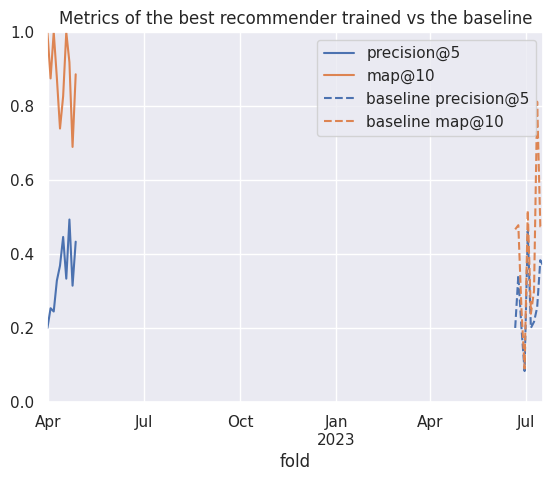

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.341464
ndcg@5          0.910263
precision@10    0.175113
ndcg@10         0.915707
map@5           0.877651
map@10          0.881279
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,83,5,0.000547,2.012112e-04,0.000346,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.123594,False,ae7c352c,512,26,2,0.6694,1.427212e-06,30d,2022-03-31
1,83,10,0.008688,8.116476e-03,0.000572,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.247327,False,ae7c352c,512,26,2,0.6694,1.427212e-06,30d,2022-03-31
2,83,15,0.000804,2.944474e-14,0.000804,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.370516,False,ae7c352c,512,26,2,0.6694,1.427212e-06,30d,2022-03-31
3,83,20,0.000958,2.250147e-23,0.000958,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.492932,False,ae7c352c,512,26,2,0.6694,1.427212e-06,30d,2022-03-31
4,83,25,0.001545,4.205333e-04,0.001125,1.000000,0.333333,0.200000,0.100000,0.066667,...,0.616957,False,ae7c352c,512,26,2,0.6694,1.427212e-06,30d,2022-03-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,64,180,0.269962,0.000000e+00,0.269962,0.416667,0.444444,0.433333,0.216667,0.144444,...,4.677117,False,29f8eb26,64,910,1,0.9155,2.418411e-07,21d,2022-04-27
36,64,185,0.272479,0.000000e+00,0.272479,0.416667,0.444444,0.433333,0.216667,0.144444,...,4.805814,False,29f8eb26,64,910,1,0.9155,2.418411e-07,21d,2022-04-27
37,64,190,0.277203,0.000000e+00,0.277203,0.416667,0.444444,0.433333,0.216667,0.144444,...,4.935637,False,29f8eb26,64,910,1,0.9155,2.418411e-07,21d,2022-04-27
38,64,195,68.208310,6.792883e+01,0.279477,0.416667,0.444444,0.433333,0.216667,0.144444,...,5.064802,False,29f8eb26,64,910,1,0.9155,2.418411e-07,21d,2022-04-27


Index intersection: MultiIndex([( 128,  34, 2,                '0.0091', ...),
            ( 128,  97, 4, '0.0021000000000000003', ...),
            ( 256,  96, 2,                '0.0784', ...),
            ( 256, 241, 2, '0.0017000000000000001', ...),
            ( 512, 665, 3,                '0.0092', ...),
            (1024,   1, 1, '0.0029000000000000002', ...),
            ( 512,  86, 3,                '0.0002', ...),
            ( 256,  32, 4,  '0.015000000000000001', ...),
            ( 256, 219, 4,                 '0.095', ...),
            ( 512, 447, 3,                '0.0008', ...),
            ...
            ( 256, 241, 2, '0.0017000000000000001', ...),
            ( 128,  34, 2,                '0.0091', ...),
            (1024, 332, 3,                '0.4863', ...),
            ( 256,  96, 2,                '0.0784', ...),
            ( 512,  86, 2, '0.0006000000000000001', ...),
            ( 512,   3, 2,                '0.0001', ...),
            (1024,   1, 1, '0.002900

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                    
128               34                   2                  0.0091               0.0007608003684554223  60d                2022-04-03               110   
                                                                                                                         2022-04-03               110   
                                                                                                                         2022-04-03               110   
                                                                                                                         2022-04-03               110   
                                                                                                                         2022-04-03               110   
...                                                                                                                                               ...   
512               86                   3                  0.0002               0.00016674901474097163 30d                2022-04-27               111   
                                                                                                                         2022-04-27               111   
                                                                                                                         2022-04-27               111   
                                                                                                                         2022-04-27               111   
                                                                                                                         2022-04-27               111   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                     
128               34                   2                  0.0091               0.0007608003684554223  60d                2022-04-03                  5   
                                                                                                                         2022-04-03                 10   
                                                                                                                         2022-04-03                 15   
                                                                                                                         2022-04-03                 20   
                                                                                                                         2022-04-03                 25   
...                                                                                                                                                ...   
512               86                   3                  0.0002               0.00016674901474097163 30d                2022-04-27                180   
                                                                                                                         2022-04-27                185   
                                                                                                                         2022-04-27                190   
                                                                                                                         2022-04-27                195   
                                                                                                                         2022-04-27                200   

                                                                                                                                          los

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_4163823/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate   config/l2              config/window_size config/fold                    
512               26                   2                  0.6694                 1.4272116622201335e-06 30d                2022-04-03                83   
256               1                    3                  0.0497                 2.0547358636780628e-06 30d                2022-04-06                86   
128               74                   2                  0.1736                 8.637993900055015e-07  10YE               2022-04-09               128   
1024              464                  2                  0.00030000000000000003 1.0963658708619861e-07 21d                2022-04-12                82   
                  332                  3                  0.4863                 0.0022115851672258576  10YE               2022-04-15               569   
128               1                    1                  0.0011                 1.0757817017662378e-06 21d                2022-04-18                86   
1024              332                  3                  0.4863                 0.0022115851672258576  10YE               2022-04-21               573   
                                                                                                                           2022-04-24               576   
128               13                   4                  0.0001                 5.370110916904851e-07  60d                2022-04-27               128   

                                                                                                                                        config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate   config/l2              config/window_size config/fold                     
512               26                   2                  0.6694                 1.4272116622201335e-06 30d                2022-04-03                  5   
256               1                    3                  0.0497                 2.0547358636780628e-06 30d                2022-04-06                160   
128               74                   2                  0.1736                 8.637993900055015e-07  10YE               2022-04-09                 10   
1024              464                  2                  0.00030000000000000003 1.0963658708619861e-07 21d                2022-04-12                120   
                  332                  3                  0.4863                 0.0022115851672258576  10YE               2022-04-15                 70   
128               1                    1                  0.0011                 1.0757817017662378e-06 21d                2022-04-18                190   
1024              332                  3                  0.4863                 0.0022115851672258576  10YE               2022-04-21                155   
                                                                                                                           2022-04-24                 55   
128               13                   4                  0.0001                 5.370110916904851e-07  60d                2022-04-27                 95   

                                                                                                                                            loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate   config/l2              config/window_size config/fold             
512               26                   2                  0.6694                 1.4272116622201335e-06 30d                2022-04-03   0.000547   
256               1                    3                  0.0497                 2.0547358636780628e-06 30d                2022-04-06   0.347423   
128               74                   2                  0.1736                 8.637993900055015e-07  10YE             

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(128, 1, 1, 0.0011, 1.0757817017662378e-06, 21d, 2022-04-18 00:00:00)                       40
(128, 13, 4, 0.0001, 5.370110916904851e-07, 60d, 2022-04-27 00:00:00)                       40
(128, 74, 2, 0.1736, 8.637993900055015e-07, 10YE, 2022-04-09 00:00:00)                      40
(256, 1, 3, 0.0497, 2.0547358636780628e-06, 30d, 2022-04-06 00:00:00)                       40
(512, 26, 2, 0.6694, 1.4272116622201335e-06, 30d, 2022-04-03 00:00:00)                      40
(1024, 332, 3, 0.4863, 0.0022115851672258576, 10YE, 2022-04-15 00:00:00)                    40
(1024, 332, 3, 0.4863, 0.0022115851672258576, 10YE, 2022-04-21 00:00:00)                    40
(1024, 332, 3, 0.4863, 0.0022115851672258576, 10YE, 2022-04-24 00:00:00)                    40
(1024, 464, 2, 0.00030000000000000003, 1.0963658708619861e-07, 21d, 2022-04-12 00:00:00)    40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2022-04-03,512,26,2,0.6694,1.4272116622201335e-06,30d,86,5,0.056986,0.056493,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.020271,0.168534,0.123594,False,ae7c352c
2022-04-06,256,1,3,0.0497,2.0547358636780628e-06,30d,88,160,0.325972,0.325951,...,0.978261,0.978261,0.978261,0.978261,0.978261,0.001142,0.682454,4.153215,False,e81bdae0
2022-04-09,128,74,2,0.1736,8.637993900055015e-07,10YE,128,10,0.323739,0.322867,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002731,0.512173,0.258411,False,c8902ebc
2022-04-12,1024,464,2,0.00030000000000000003,1.0963658708619861e-07,21d,84,120,0.100641,0.100640,...,0.826087,0.826087,0.826087,0.826087,0.826087,0.001244,0.559610,3.139276,False,86369ef4
2022-04-15,1024,332,3,0.4863,0.0022115851672258576,10YE,573,70,0.731839,0.138075,...,0.750000,0.750000,0.750000,0.750000,0.750000,0.001656,1.196595,1.809309,False,f84fbe1e
2022-04-18,128,1,1,0.0011,1.0757817017662378e-06,21d,84,190,0.475007,0.475006,...,0.853968,0.896825,0.896825,0.896825,0.896825,0.001296,0.747448,4.932547,False,c5e33dad
2022-04-21,1024,332,3,0.4863,0.0022115851672258576,10YE,576,155,4.800715,1.130554,...,0.937500,0.937500,0.937500,0.937500,0.937500,0.001881,2.437891,4.003908,False,8c3b527d
2022-04-24,1024,332,3,0.4863,0.0022115851672258576,10YE,580,55,0.878577,0.152818,...,0.746154,0.884615,0.923077,0.923077,0.923077,0.001827,0.971822,1.464056,False,f413de19
2022-04-27,128,13,4,0.0001,5.370110916904851e-07,60d,128,95,0.681947,0.681946,...,0.794444,0.811111,0.811111,0.811111,0.811111,0.002251,0.802168,2.519675,False,24001e53


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/SharkDAO/models/lightgcn-best-test_3d_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.347170,0.637571
std,0.082413,0.071080
min,0.244444,0.537217
25%,0.285714,0.608333
50%,0.333333,0.657222
75%,0.384615,0.666667
max,0.493333,0.740741


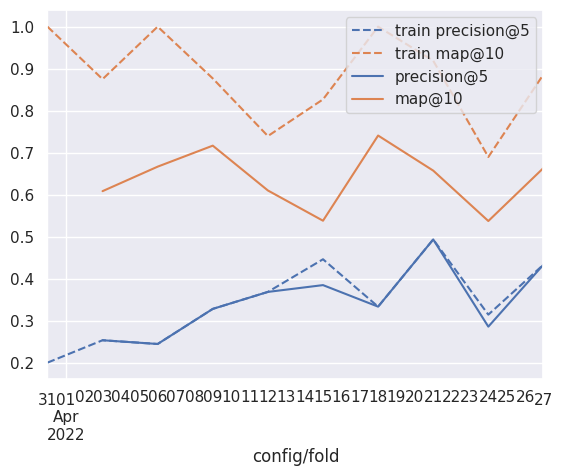

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2022-04-03 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-21,0.600000,0.333333,0.200000,0.100000,0.066667,0.010000,0.500000,0.479751,0.458305,0.458305,...,0.600000,0.600000,0.600000,0.583333,0.666667,0.666667,0.666667,0.666667,0.666667,0.126366
2023-06-24,0.142857,0.476190,0.342857,0.171429,0.114286,0.017143,0.142857,0.575817,0.608663,0.608663,...,1.000000,1.000000,1.000000,0.333333,0.750000,0.875000,0.875000,0.875000,0.875000,0.123368
2023-06-27,0.000000,0.000000,0.200000,0.100000,0.066667,0.010000,0.000000,0.000000,0.430677,0.430677,...,1.000000,1.000000,1.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,0.108643
2023-06-30,0.000000,0.138889,0.083333,0.041667,0.027778,0.004167,0.000000,0.116848,0.116848,0.116848,...,0.180556,0.180556,0.180556,0.000000,0.433333,0.433333,0.433333,0.433333,0.433333,0.120138
2023-07-03,0.250000,0.479167,0.462500,0.268750,0.179167,0.026875,0.250000,0.525917,0.595538,0.628223,...,0.773958,0.773958,0.773958,0.458333,0.498889,0.617778,0.651111,0.651111,0.651111,0.127482
2023-07-06,0.200000,0.200000,0.200000,0.120000,0.080000,0.012000,0.200000,0.231985,0.309426,0.336021,...,0.440000,0.440000,0.440000,0.555556,0.389583,0.424074,0.424074,0.424074,0.424074,0.127107
2023-07-09,0.083333,0.111111,0.216667,0.108333,0.072222,0.010833,0.080000,0.157792,0.438739,0.434993,...,0.875000,0.875000,0.875000,0.583333,0.583333,0.625000,0.625000,0.625000,0.625000,0.129676
2023-07-12,0.777778,0.333333,0.255556,0.127778,0.085185,0.012778,0.777778,0.782357,0.866194,0.866194,...,1.000000,1.000000,1.000000,0.869048,0.916667,0.916667,0.916667,0.916667,0.916667,0.125586
2023-07-15,0.416667,0.361111,0.383333,0.250000,0.166667,0.025000,0.416667,0.433776,0.504734,0.596260,...,0.775000,0.775000,0.775000,0.430000,0.493750,0.641667,0.641667,0.641667,0.641667,0.126526


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.39 & 0.20 & 0.99 & 1.00 & 1.00 & 1.00 & 1.00 & 1.00 \\
Leaky GNN & 0.36 & 0.18 & 0.98 & 1.00 & 0.86 & 0.87 & 0.90 & 0.91 \\
GNN & 0.35 & 0.18 & 0.96 & 1.00 & 0.63 & 0.64 & 0.72 & 0.74 \\
OpenPop & 0.27 & 0.16 & 0.68 & 0.76 & 0.39 & 0.41 & 0.48 & 0.51 \\
\end{tabular}



/tmp/ipykernel_4163823/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_4163823/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             map@5           10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@10         10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@5          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@10    10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@5     10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@10       10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@5        10  2023-07-04 12:00:00  2023-06-21 00:00:00   
Leaky GNN    map@10           9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             map@5            9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             ndcg@10          9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             ndcg@5           9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             precision@10     9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             precision@5      9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             recall@10        9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             recall@5         9  2022-04-15 00:00:00  2022-04-03 00:00:00   
GNN          map@10           9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             map@5            9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             ndcg@10          9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             ndcg@5           9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             precision@10     9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             precision@5      9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             recall@10        9  2022-04-15 00:00:00  2022-04-03 00:00:00   
             recall@5         9  2022-04-15 00:00:00  2022-04-03 00:00:00   
OpenPop      map@10          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             map@5           10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@10         10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             ndcg@5          10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@10    10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             precision@5     10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@10       10  2023-07-04 12:00:00  2023-06-21 00:00:00   
             recall@5        10  2023-07-04 12:00:00  2023-06-21 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-27 18:00:00  2023-07-04 12:00:00   
             map@5         2023-06-27 18:00:00  2023-07-04 12:00:00   
             ndcg@10       2023-06-27 18:00:00  2023-07-04 12:00:00   
             ndcg@5        2023-06-27 18:00:00  2023-07-04 12:00:00   
             precision@10  2023-06-27 18:00:00  2023-07-04 12:00:00   
             precision@5   2023-06-27 18:00:00  2023-07-04 12:00:00   
             recall@10     2023-06-27 18:00:00  2023-07-04 12:00:00   
             recall@5      2023-06-27 18:00:00  2023-07-04 12:00:00   
Leaky GNN    map@10        2022-04-09 00:00:00  2022-04-15 00:00:00   
             map@5         2022-04-09 00:00:00  2022-04-15 00:00:00   
             ndcg@10       2022-04-09 00:00:00  2022-04-15 00:00:00   
             ndcg@5        2022-04-09 00:00:00  2022-04-15 00:00:00   
             precision@10  2022-04-09 00:00:00  2022-04-15 00:00:00   
             precision@5   2022-04-09 00:00:00  2022-04-15 00:00:00   
             recall@10     2022-04-09 00:00:00  2022-04-15 00:00:00   
             recall@5      2022-04-09 00:00:00  2022-

/tmp/ipykernel_4163823/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_4163823/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  1.000000  0.000000  1.000000  1.000000   
             precision@5   10.0  0.393491  0.148915  0.200000  0.278000   
Leaky GNN    map@10        10.0  0.881279  0.107266  0.689720  0.838862   
             precision@5   10.0  0.341464  0.095084  0.200000  0.268571   
GNN          map@10         9.0  0.637571  0.071080  0.537217  0.608333   
             precision@5    9.0  0.347170  0.082413  0.244444  0.285714   
OpenPop      map@10        10.0  0.409897  0.199515  0.090278  0.262587   
             precision@5   10.0  0.271091  0.114085  0.083333  0.200000   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.338095  0.505000  0.612500  
Leaky GNN    map@10       0.881447  0.979722  1.000000  
             precision@5  0.330667  0.417105  0.493333  
GNN          map@10       0.657222  0.666667  0.740741  
             precision@5  0.333333  0.384615  0.493333  
OpenPop      map@10       0.468750  0.477106  0.812037  
             precision@5  0.236111  0.360714  0.462500

Cannot show ipywidgets in text

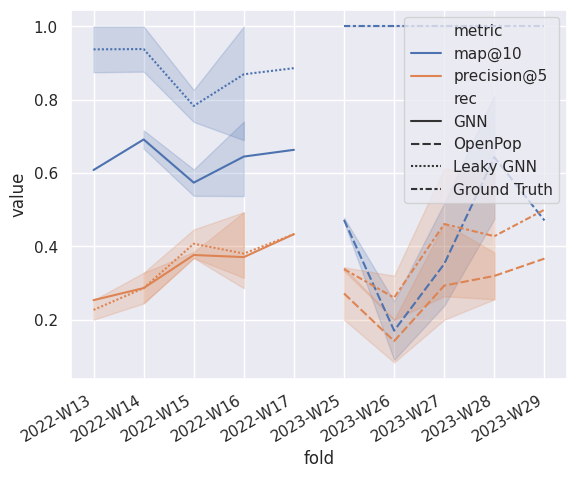

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_4163823/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_4163823/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.393491,0.148915,0.200000,0.278000,0.338095,0.505000,0.612500
GNN,precision@5,9.0,0.347170,0.082413,0.244444,0.285714,0.333333,0.384615,0.493333
OpenPop,precision@5,10.0,0.271091,0.114085,0.083333,0.200000,0.236111,0.360714,0.462500


Cannot show ipywidgets in text

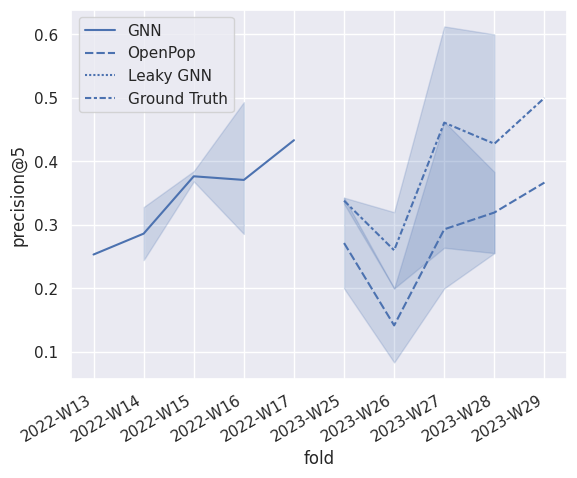

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_4163823/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_4163823/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.393491,0.148915,0.200000,0.278000,0.338095,0.505000,0.612500
Leaky GNN,precision@5,9.0,0.357182,0.085975,0.244444,0.314286,0.333333,0.433333,0.493333
GNN,precision@5,9.0,0.347170,0.082413,0.244444,0.285714,0.333333,0.384615,0.493333
OpenPop,precision@5,10.0,0.271091,0.114085,0.083333,0.200000,0.236111,0.360714,0.462500


Cannot show ipywidgets in text

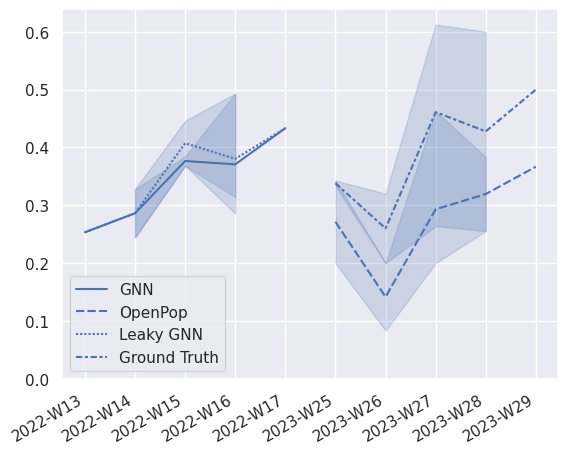

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_4163823/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_4163823/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GNN,map@10,9.0,0.637571,0.071080,0.537217,0.608333,0.657222,0.666667,0.740741
OpenPop,map@10,10.0,0.409897,0.199515,0.090278,0.262587,0.468750,0.477106,0.812037


Cannot show ipywidgets in text

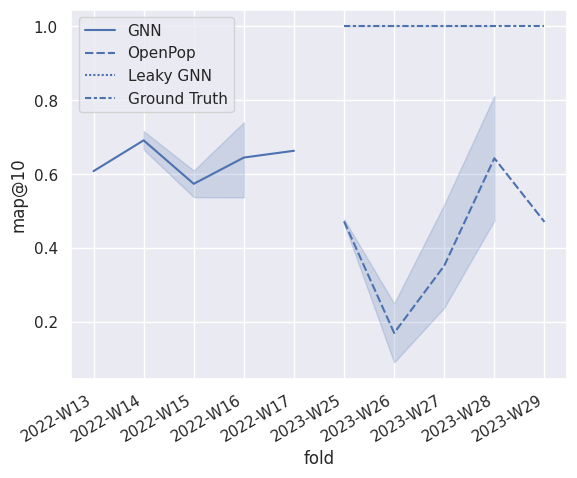

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_4163823/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_4163823/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GNN,ndcg@10,9.0,0.735232,0.051081,0.661317,0.709717,0.745280,0.759779,0.808849
OpenPop,ndcg@10,10.0,0.509381,0.202494,0.116848,0.431756,0.527283,0.615388,0.866194


Cannot show ipywidgets in text

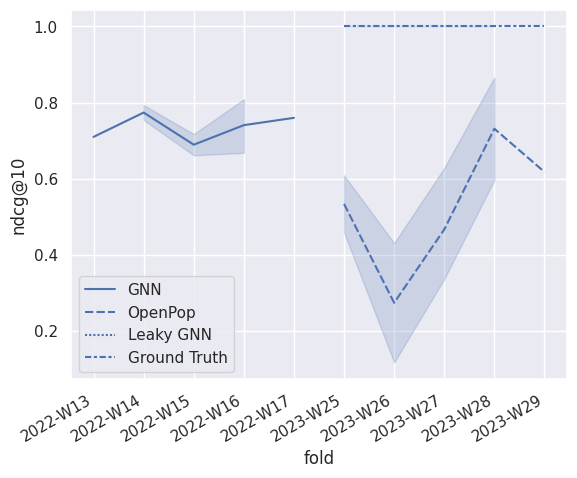

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_4163823/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_4163823/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Leaky GNN,ndcg@10,9.0,0.906341,0.073670,0.777544,0.877201,0.913578,0.938685,1.000000
GNN,ndcg@10,9.0,0.735232,0.051081,0.661317,0.709717,0.745280,0.759779,0.808849
OpenPop,ndcg@10,10.0,0.509381,0.202494,0.116848,0.431756,0.527283,0.615388,0.866194


Cannot show ipywidgets in text

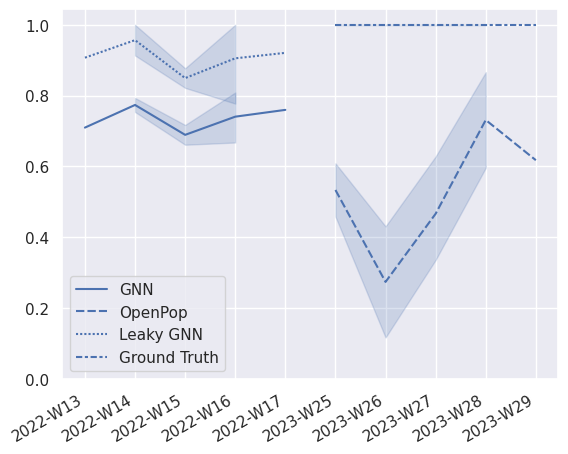

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')